## 공유 드라이브 '04.기타자료' > 'Data'에서 'concat_QnA2.zip' 드라이브에 바로가기 추가
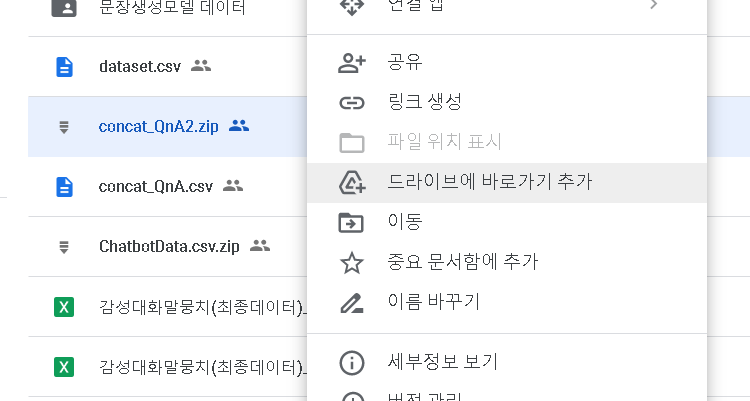

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import urllib.request
import pandas as pd

import numpy as np
from numpy import dot
from numpy.linalg import norm

# embedding model instsall 
!pip install sentence_transformers
from sentence_transformers import SentenceTransformer
model = SentenceTransformer('sentence-transformers/xlm-r-100langs-bert-base-nli-stsb-mean-tokens')

## 경고 해제
pd.set_option('mode.chained_assignment',  None)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 77.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 81.7 MB/s eta 0:00:00
  Created wheel for sentence_transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125938 sha256=d17a387e5c11a6518899059d0c78891136fd9c9b63dfcf184f3e4307b8cb0dc8
  Stored in directory: /root/.cache/pip/wheels/5e/6f/8c/d88aec621f3f542d26fac0342bef5e693335d125f4e54aeffe
Successfully built sentence_transformers


In [ ]:
!unzip -qq /content/drive/MyDrive/concat_QnA2.zip

In [ ]:
train_data = pd.read_csv('/content/content/concat_QnA2.csv')
train_data.head()

,Unnamed: 0,Q,A,embedding
0,0,일은 왜 해도 해도 끝이 없을까? 화가 난다.,많이 힘드시겠어요. 주위에 의논할 상대가 있나요?,[ 4.18126494e-01 -1.09319858e-01 1.07261097e+...
1,1,이번 달에 또 급여가 깎였어! 물가는 오르는데 월급만 자꾸 깎이니까 너무 화가 나.,급여가 줄어 속상하시겠어요. 월급이 줄어든 것을 어떻게 보완하실 건가요?,[-6.47095680e-01 -1.06169328e-01 2.19594628e-...
2,2,회사에 신입이 들어왔는데 말투가 거슬려. 그런 애를 매일 봐야 한다고 생각하니까 스...,회사 동료 때문에 스트레스를 많이 받는 것 같아요. 문제 해결을 위해 어떤 노력을 ...,[-2.86721021e-01 8.25529397e-02 6.84844136e-...
3,3,직장에서 막내라는 이유로 나에게만 온갖 심부름을 시켜. 일도 많은 데 정말 분하고 ...,관련 없는 심부름을 모두 하게 되어서 노여우시군요. 어떤 것이 상황을 나아질 수 있...,[-5.84136993e-02 4.27219659e-01 4.11030054e-...
4,4,얼마 전 입사한 신입사원이 나를 무시하는 것 같아서 너무 화가 나.,무시하는 것 같은 태도에 화가 나셨군요. 상대방의 어떤 행동이 그런 감정을 유발하는...,[-4.87763792e-01 4.18264955e-01 4.33938116e-...


In [ ]:
t_data = train_data[['Q','A','embedding']]
t_data

,Q,A,embedding
0,일은 왜 해도 해도 끝이 없을까? 화가 난다.,많이 힘드시겠어요. 주위에 의논할 상대가 있나요?,[ 4.18126494e-01 -1.09319858e-01 1.07261097e+...
1,이번 달에 또 급여가 깎였어! 물가는 오르는데 월급만 자꾸 깎이니까 너무 화가 나.,급여가 줄어 속상하시겠어요. 월급이 줄어든 것을 어떻게 보완하실 건가요?,[-6.47095680e-01 -1.06169328e-01 2.19594628e-...
2,회사에 신입이 들어왔는데 말투가 거슬려. 그런 애를 매일 봐야 한다고 생각하니까 스...,회사 동료 때문에 스트레스를 많이 받는 것 같아요. 문제 해결을 위해 어떤 노력을 ...,[-2.86721021e-01 8.25529397e-02 6.84844136e-...
3,직장에서 막내라는 이유로 나에게만 온갖 심부름을 시켜. 일도 많은 데 정말 분하고 ...,관련 없는 심부름을 모두 하게 되어서 노여우시군요. 어떤 것이 상황을 나아질 수 있...,[-5.84136993e-02 4.27219659e-01 4.11030054e-...
4,얼마 전 입사한 신입사원이 나를 무시하는 것 같아서 너무 화가 나.,무시하는 것 같은 태도에 화가 나셨군요. 상대방의 어떤 행동이 그런 감정을 유발하는...,[-4.87763792e-01 4.18264955e-01 4.33938116e-...
...,...,...,...
125287,자식들 결혼시키는데 집 문제도 척척 해결해 주는 게 부럽더라고.,자식들 결혼 시킬때 문제없이 해주시는게 부러우셨군요.,[ 5.07548079e-03 2.04530299e-01 7.48744905e-...
125288,병원에 자주 가야겠어.,병원에 자주 가실 생각이군요.,[ 2.87972093e-01 -2.71365941e-01 1.08230889e+...
125289,당분간 걔네들과 멀리하고 지내야 할 거 같아.,그 사람들과 멀리 지낼 생각이시군요.,[-2.85889626e-01 -1.98187485e-01 1.42084157e+...
125290,벌어둔 것들이 다 없는 기분이라 화가 나.,벌어둔 것들이 다 없는 기분이라 화가 나시는군요.,[ 2.91652143e-01 4.11232501e-01 9.22343552e-...


## str 형식의 embedding, numpy.array로 바꾸기

In [ ]:
# t_data['embedding'] str -> numpy 형변환
a = []
for _ in range(125292):
  tmp = t_data['embedding'][_].replace('[', '').replace(']', '').replace('\n', '')
  s_to_n = np.fromstring(tmp, dtype='f', sep=' ')
  a.append(np.array(s_to_n, dtype='f'))
  if _%12529 == 0 :
    print("\r", end='')
    print(f'{_//12529*10}% : ', '##'*(_//12529), end='')
print()
a

100% :  ####################


[array([ 4.18126494e-01, -1.09319858e-01,  1.07261097e+00, -1.15676515e-01,
        -3.38005245e-01,  3.95607710e-01,  3.48847151e-01, -2.63721913e-01,
         6.54461086e-02, -3.77195686e-01, -1.89260453e-01,  4.22230929e-01,
        -1.46388225e-02,  2.82456785e-01, -1.08709879e-01,  9.57638249e-02,
         2.06480592e-01, -7.01043487e-01, -3.54284979e-02, -6.51586354e-02,
         7.49261826e-02, -4.10418123e-01,  1.00517309e+00, -4.23876226e-01,
        -6.95859864e-02, -9.76381004e-02, -2.21530542e-01, -3.03516507e-01,
        -6.72632396e-01, -9.23347101e-02, -1.47187606e-01, -8.03727627e-01,
         2.89513588e-01, -5.37522845e-02, -2.63121754e-01,  1.15517922e-01,
         5.42863965e-01,  1.35936648e-01,  1.03043625e-02, -5.62432230e-01,
         6.55866146e-01,  1.42220184e-01, -4.87280905e-01,  3.72706324e-01,
         1.26967803e-01,  1.32310987e-01,  2.33985499e-01, -5.61701477e-01,
        -4.47890274e-02, -5.77306971e-02, -7.81095386e-01,  6.27470911e-01,
         9.1

In [ ]:
new_data = t_data[['Q','A']]
new_data['embedding'] = a
new_data

,Q,A,embedding
0,일은 왜 해도 해도 끝이 없을까? 화가 난다.,많이 힘드시겠어요. 주위에 의논할 상대가 있나요?,"[0.4181265, -0.10931986, 1.072611, -0.11567651..."
1,이번 달에 또 급여가 깎였어! 물가는 오르는데 월급만 자꾸 깎이니까 너무 화가 나.,급여가 줄어 속상하시겠어요. 월급이 줄어든 것을 어떻게 보완하실 건가요?,"[-0.6470957, -0.10616933, 0.21959463, 0.033426..."
2,회사에 신입이 들어왔는데 말투가 거슬려. 그런 애를 매일 봐야 한다고 생각하니까 스...,회사 동료 때문에 스트레스를 많이 받는 것 같아요. 문제 해결을 위해 어떤 노력을 ...,"[-0.28672102, 0.08255294, 0.68484414, -0.21890..."
3,직장에서 막내라는 이유로 나에게만 온갖 심부름을 시켜. 일도 많은 데 정말 분하고 ...,관련 없는 심부름을 모두 하게 되어서 노여우시군요. 어떤 것이 상황을 나아질 수 있...,"[-0.0584137, 0.42721966, 0.41103005, -0.150861..."
4,얼마 전 입사한 신입사원이 나를 무시하는 것 같아서 너무 화가 나.,무시하는 것 같은 태도에 화가 나셨군요. 상대방의 어떤 행동이 그런 감정을 유발하는...,"[-0.4877638, 0.41826496, 0.43393812, -0.298697..."
...,...,...,...
125287,자식들 결혼시키는데 집 문제도 척척 해결해 주는 게 부럽더라고.,자식들 결혼 시킬때 문제없이 해주시는게 부러우셨군요.,"[0.005075481, 0.2045303, 0.7487449, 0.14239135..."
125288,병원에 자주 가야겠어.,병원에 자주 가실 생각이군요.,"[0.2879721, -0.27136594, 1.0823089, -0.3500963..."
125289,당분간 걔네들과 멀리하고 지내야 할 거 같아.,그 사람들과 멀리 지낼 생각이시군요.,"[-0.28588963, -0.19818749, 1.4208416, 0.170376..."
125290,벌어둔 것들이 다 없는 기분이라 화가 나.,벌어둔 것들이 다 없는 기분이라 화가 나시는군요.,"[0.29165214, 0.4112325, 0.92234355, -0.1798538..."


In [ ]:
def cos_sim(A, B):
  return dot(A, B)/(norm(A)*norm(B))

def return_similar_answer(input):
    embedding = model.encode(input)
    new_data['score'] = new_data.apply(lambda x: cos_sim(x['embedding'], embedding), axis=1)
    return new_data.loc[new_data['score'].idxmax()]['A']

In [ ]:
sentence = []
print("'종료' 입력시 프로그램 종료")
while True :
  tmp = []
  print("="*80)
  Q = input("Q : ")
  if Q == '종료' :
    print("="*80)
    break
  print("A : ", return_similar_answer(Q))
  tmp.append(Q)
  tmp.append(return_similar_answer(Q))
  sentence.append(tmp)

## 결과가 좋지 않았던 경우
<pre>
================================================================================
Q : 이번달 급여가 또 깎였어!
A :  좋은 소식이네요. 축하드려요.
================================================================================
Q : 내가 잘못한거 아닌데. 엄마는 언니편이야
A :  언니로서 해야 할 역할을 못 한다는 생각에 힘드시겠어요.
================================================================================
Q : 종료
================================================================================
</pre>